# Analysis of cybersecurity risks

In [1]:
import pandas as pd

In [2]:
import numpy as np

In [3]:
import matplotlib.pyplot as plt

In [4]:
import seaborn as sns

In [5]:
cybersecurity_risks = pd.read_csv('cybersecurity_attacks.csv')

In [6]:
cybersecurity_risks.head()

,Timestamp,Source IP Address,Destination IP Address,Source Port,Destination Port,Protocol,Packet Length,Packet Type,Traffic Type,Payload Data,...,Action Taken,Severity Level,User Information,Device Information,Network Segment,Geo-location Data,Proxy Information,Firewall Logs,IDS/IPS Alerts,Log Source
0,2023-05-30 06:33:58,103.216.15.12,84.9.164.252,31225,17616,ICMP,503,Data,HTTP,Qui natus odio asperiores nam. Optio nobis ius...,...,Logged,Low,Reyansh Dugal,Mozilla/5.0 (compatible; MSIE 8.0; Windows NT ...,Segment A,"Jamshedpur, Sikkim",150.9.97.135,Log Data,NaN,Server
1,2020-08-26 07:08:30,78.199.217.198,66.191.137.154,17245,48166,ICMP,1174,Data,HTTP,Aperiam quos modi officiis veritatis rem. Omni...,...,Blocked,Low,Sumer Rana,Mozilla/5.0 (compatible; MSIE 8.0; Windows NT ...,Segment B,"Bilaspur, Nagaland",NaN,Log Data,NaN,Firewall
2,2022-11-13 08:23:25,63.79.210.48,198.219.82.17,16811,53600,UDP,306,Control,HTTP,Perferendis sapiente vitae soluta. Hic delectu...,...,Ignored,Low,Himmat Karpe,Mozilla/5.0 (compatible; MSIE 9.0; Windows NT ...,Segment C,"Bokaro, Rajasthan",114.133.48.179,Log Data,Alert Data,Firewall
3,2023-07-02 10:38:46,163.42.196.10,101.228.192.255,20018,32534,UDP,385,Data,HTTP,Totam maxime beatae expedita explicabo porro l...,...,Blocked,Medium,Fateh Kibe,Mozilla/5.0 (Macintosh; PPC Mac OS X 10_11_5; ...,Segment B,"Jaunpur, Rajasthan",NaN,NaN,Alert Data,Firewall
4,2023-07-16 13:11:07,71.166.185.76,189.243.174.238,6131,26646,TCP,1462,Data,DNS,Odit nesciunt dolorem nisi iste iusto. Animi v...,...,Blocked,Low,Dhanush Chad,Mozilla/5.0 (compatible; MSIE 5.0; Windows NT ...,Segment C,"Anantapur, Tripura",149.6.110.119,NaN,Alert Data,Firewall


In [7]:
cybersecurity_risks.columns

Index(['Timestamp', 'Source IP Address', 'Destination IP Address',
       'Source Port', 'Destination Port', 'Protocol', 'Packet Length',
       'Packet Type', 'Traffic Type', 'Payload Data', 'Malware Indicators',
       'Anomaly Scores', 'Alerts/Warnings', 'Attack Type', 'Attack Signature',
       'Action Taken', 'Severity Level', 'User Information',
       'Device Information', 'Network Segment', 'Geo-location Data',
       'Proxy Information', 'Firewall Logs', 'IDS/IPS Alerts', 'Log Source'],
      dtype='object')

## A bit of data engineering

In [8]:
cybersecurity_risks.nunique()

Timestamp                 39997
Source IP Address         40000
Destination IP Address    40000
Source Port               29761
Destination Port          29895
Protocol                      3
Packet Length              1437
Packet Type                   2
Traffic Type                  3
Payload Data              40000
Malware Indicators            1
Anomaly Scores             9826
Alerts/Warnings               1
Attack Type                   3
Attack Signature              2
Action Taken                  3
Severity Level                3
User Information          32389
Device Information        32104
Network Segment               3
Geo-location Data          8723
Proxy Information         20148
Firewall Logs                 1
IDS/IPS Alerts                1
Log Source                    2
dtype: int64

In [9]:
cybersecurity_risks['Anomaly Scores']

0        28.67
1        51.50
2        87.42
3        15.79
4         0.52
         ...  
39995    39.28
39996    27.25
39997    31.01
39998    97.85
39999    34.63
Name: Anomaly Scores, Length: 40000, dtype: float64

In [10]:
cybersecurity_risks['Geo-location Data']

0                   Jamshedpur, Sikkim
1                   Bilaspur, Nagaland
2                    Bokaro, Rajasthan
3                   Jaunpur, Rajasthan
4                   Anantapur, Tripura
                     ...              
39995                  Nashik, Manipur
39996                Vadodara, Mizoram
39997    Mahbubnagar, Himachal Pradesh
39998      Rourkela, Arunachal Pradesh
39999         Pudukkottai, West Bengal
Name: Geo-location Data, Length: 40000, dtype: object

In [13]:
cybersecurity_risks['Packet Length']

0         503
1        1174
2         306
3         385
4        1462
         ... 
39995    1428
39996    1184
39997    1043
39998     483
39999    1175
Name: Packet Length, Length: 40000, dtype: int64

In [11]:
cybersecurity_risks.isna().any()

Timestamp                 False
Source IP Address         False
Destination IP Address    False
Source Port               False
Destination Port          False
Protocol                  False
Packet Length             False
Packet Type               False
Traffic Type              False
Payload Data              False
Malware Indicators         True
Anomaly Scores            False
Alerts/Warnings            True
Attack Type               False
Attack Signature          False
Action Taken              False
Severity Level            False
User Information          False
Device Information        False
Network Segment           False
Geo-location Data         False
Proxy Information          True
Firewall Logs              True
IDS/IPS Alerts             True
Log Source                False
dtype: bool

Convert Nans to actual strings

In [12]:
cybersecurity_risks['Firewall Logs'] = cybersecurity_risks['Firewall Logs'].fillna(value='No logs')
cybersecurity_risks['IDS/IPS Alerts'] = cybersecurity_risks['IDS/IPS Alerts'].fillna(value='No alerted data')
cybersecurity_risks['Malware Indicators'] = cybersecurity_risks['Malware Indicators'].fillna(value='No IoC')
cybersecurity_risks['Alerts/Warnings'] = cybersecurity_risks['Alerts/Warnings'].fillna(value='Not Alerted')
cybersecurity_risks['Proxy Information'] = cybersecurity_risks['Proxy Information'].fillna(value='No information')

Check the values of all categorical columns

In [14]:
cybersecurity_risks['Action Taken'].unique()

array(['Logged', 'Blocked', 'Ignored'], dtype=object)

In [15]:
cybersecurity_risks['Alerts/Warnings'].unique()

array(['Not Alerted', 'Alert Triggered'], dtype=object)

In [16]:
cybersecurity_risks['Attack Signature'].unique()

array(['Known Pattern B', 'Known Pattern A'], dtype=object)

In [17]:
cybersecurity_risks['Attack Type'].unique()

array(['Malware', 'DDoS', 'Intrusion'], dtype=object)

In [19]:
cybersecurity_risks['Firewall Logs'].unique()

array(['Log Data', 'No logs'], dtype=object)

In [20]:
cybersecurity_risks['IDS/IPS Alerts'].unique()

array(['No alerted data', 'Alert Data'], dtype=object)

In [21]:
cybersecurity_risks['Log Source'].unique()

array(['Server', 'Firewall'], dtype=object)

In [22]:
cybersecurity_risks['Malware Indicators'].unique()

array(['IoC Detected', 'No IoC'], dtype=object)

In [23]:
cybersecurity_risks['Network Segment'].unique()

array(['Segment A', 'Segment B', 'Segment C'], dtype=object)

In [24]:
cybersecurity_risks['Packet Type'].unique()

array(['Data', 'Control'], dtype=object)

In [25]:
cybersecurity_risks['Protocol'].unique()

array(['ICMP', 'UDP', 'TCP'], dtype=object)

In [26]:
cybersecurity_risks['Severity Level'].unique()

array(['Low', 'Medium', 'High'], dtype=object)

In [27]:
cybersecurity_risks['Traffic Type'].unique()

array(['HTTP', 'DNS', 'FTP'], dtype=object)

In [28]:
cybersecurity_risks['Proxy Information'].unique()

array(['150.9.97.135', 'No information', '114.133.48.179', ...,
       '60.51.30.46', '137.76.130.8', '112.169.115.139'], dtype=object)

### Create a MonthYear column to check time changes

In [29]:
cybersecurity_risks['Timestamp'] = pd.to_datetime(cybersecurity_risks['Timestamp'])

In [30]:
cybersecurity_risks['Timestamp']

0       2023-05-30 06:33:58
1       2020-08-26 07:08:30
2       2022-11-13 08:23:25
3       2023-07-02 10:38:46
4       2023-07-16 13:11:07
                ...        
39995   2023-05-26 14:08:42
39996   2023-03-27 00:38:27
39997   2022-03-31 01:45:49
39998   2023-09-22 18:32:38
39999   2023-10-10 11:59:52
Name: Timestamp, Length: 40000, dtype: datetime64[ns]

In [31]:
cybersecurity_risks['monthyear'] = pd.to_datetime(cybersecurity_risks['Timestamp'].dt.strftime('%m/%Y'))

In [32]:
cybersecurity_risks['monthyear']

0       2023-05-01
1       2020-08-01
2       2022-11-01
3       2023-07-01
4       2023-07-01
           ...    
39995   2023-05-01
39996   2023-03-01
39997   2022-03-01
39998   2023-09-01
39999   2023-10-01
Name: monthyear, Length: 40000, dtype: datetime64[ns]

### Create a Browser and an Operative systems columns in order to check for resistence to attackes for each of them

In [18]:
cybersecurity_risks['Device Information'].unique()

array(['Mozilla/5.0 (compatible; MSIE 8.0; Windows NT 6.2; Trident/5.0)',
       'Mozilla/5.0 (compatible; MSIE 8.0; Windows NT 6.0; Trident/4.0)',
       'Mozilla/5.0 (compatible; MSIE 9.0; Windows NT 6.2; Trident/5.0)',
       ...,
       'Mozilla/5.0 (Windows; U; Windows NT 4.0) AppleWebKit/533.2.3 (KHTML, like Gecko) Version/4.0.3 Safari/533.2.3',
       'Mozilla/5.0 (X11; Linux i686) AppleWebKit/536.2 (KHTML, like Gecko) Chrome/15.0.852.0 Safari/536.2',
       'Mozilla/5.0 (iPod; U; CPU iPhone OS 3_0 like Mac OS X; tg-TJ) AppleWebKit/534.33.5 (KHTML, like Gecko) Version/4.0.5 Mobile/8B116 Safari/6534.33.5'],
      dtype=object)

In [53]:
def find_browser(string):
    if 'Mozilla' in string:
        return 'Mozilla Firefox'
    elif 'Microsoft' in string:
        return 'Microsoft Engines'
    elif 'Safari' in string:
        return 'Safari'
    elif 'Chrome' in string:
        return 'Google Chrome'
    elif 'Opera' in string:
        return 'Opera'
    elif 'Vivaldi' in string:
        return 'Vivaldi'
cybersecurity_risks['Browser'] = cybersecurity_risks['Device Information'].apply(lambda x: find_browser(x))

In [64]:
def device(string):
    if 'Mac OS' in string:
        return 'Mac OS'
    elif 'Windows' in string:
        return 'Windows'
    elif 'Linux' in string:
        return 'Linux'
    elif 'Android' in string:
        return 'Android'
cybersecurity_risks['Operative Systems'] = cybersecurity_risks['Device Information'].apply(lambda x: device(x))

In [66]:
new_cybersecurity_risks = cybersecurity_risks.copy()

In [67]:
for col in ['Protocol', 'Packet Type', 'Traffic Type', 'Malware Indicators', 
            'Alerts/Warnings', 'Attack Type', 'Attack Signature', 'Action Taken', 
            'Severity Level', 'Network Segment', 'Firewall Logs', 'IDS/IPS Alerts',
            'Log Source']:
    new_cybersecurity_risks[col] = new_cybersecurity_risks[col].astype('category').cat.codes

## Analyze trends of non categorical columns with respect to categorical columns

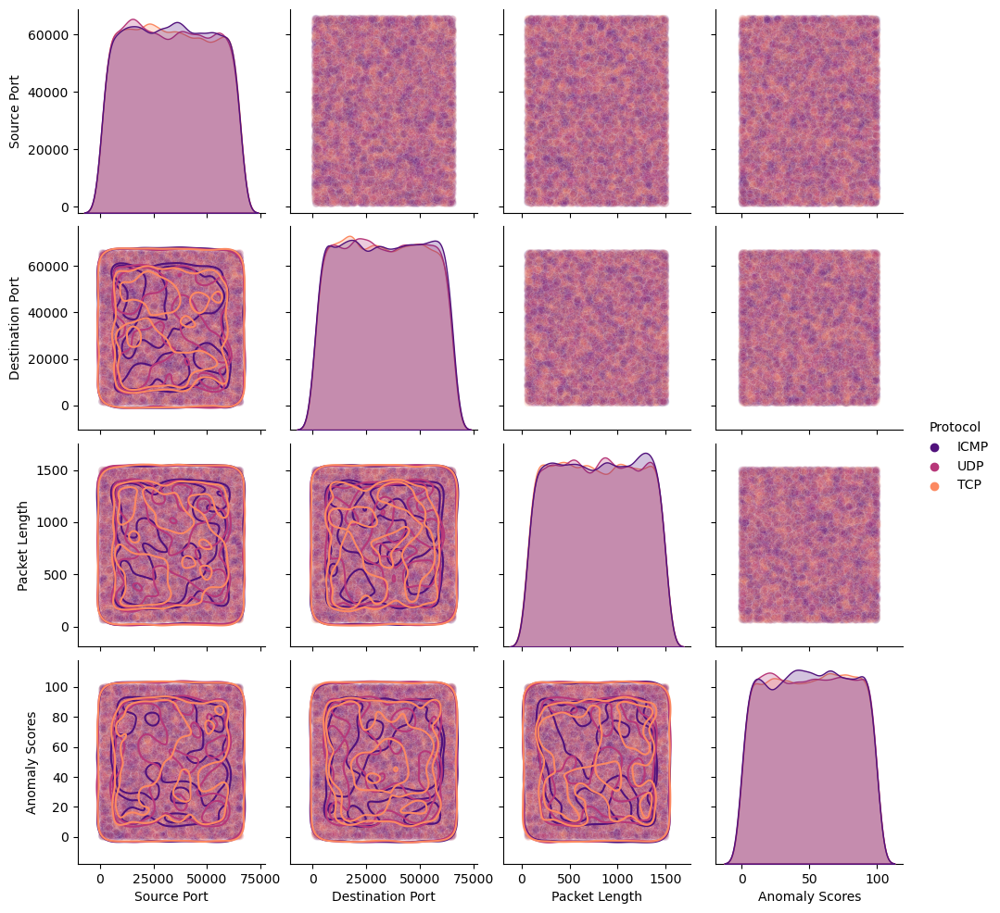

In [35]:
g = sns.pairplot(data = cybersecurity_risks, hue = 'Protocol', palette = 'magma', diag_kind="kde",  plot_kws={'alpha': 0.1})
g.map_lower(sns.kdeplot, levels = 4, color ='.2')

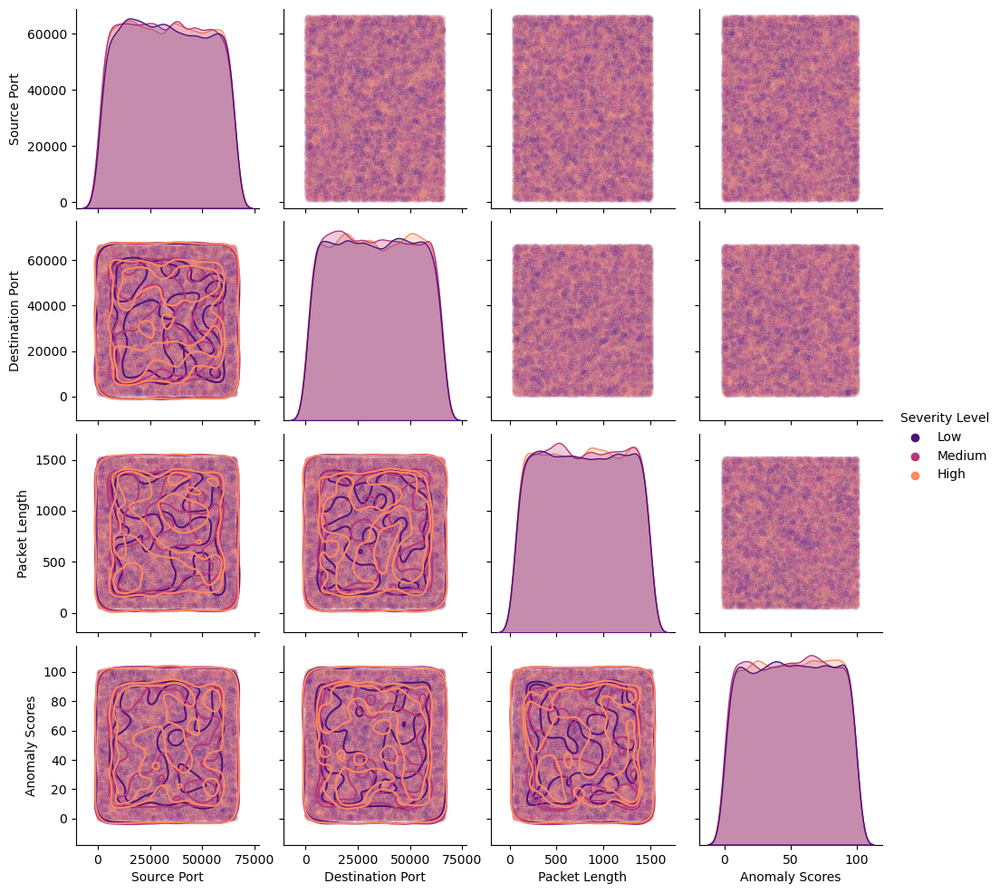

In [36]:
g = sns.pairplot(data = cybersecurity_risks, hue = 'Severity Level', palette = 'magma', diag_kind="kde",  plot_kws={'alpha': 0.1})
g.map_lower(sns.kdeplot, levels = 4)

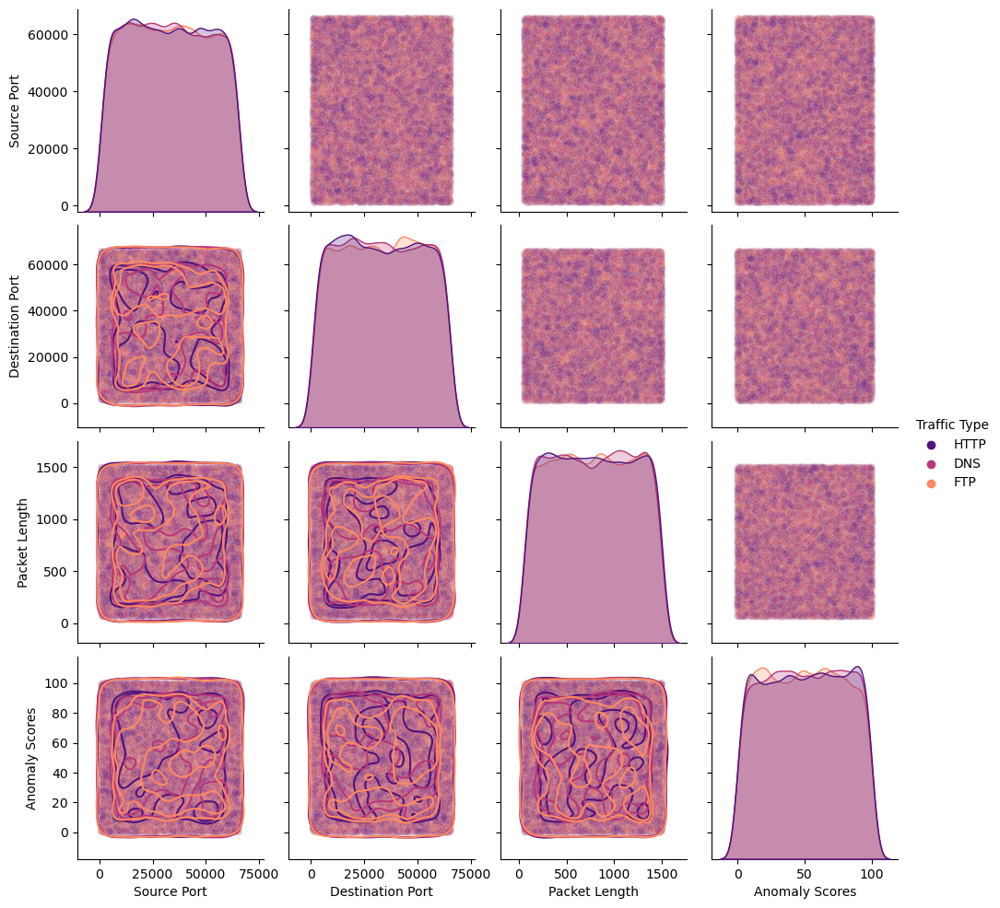

In [37]:
g = sns.pairplot(data = cybersecurity_risks, hue = 'Traffic Type', palette = 'magma', diag_kind="kde",  plot_kws={'alpha': 0.1})
g.map_lower(sns.kdeplot, levels = 4)

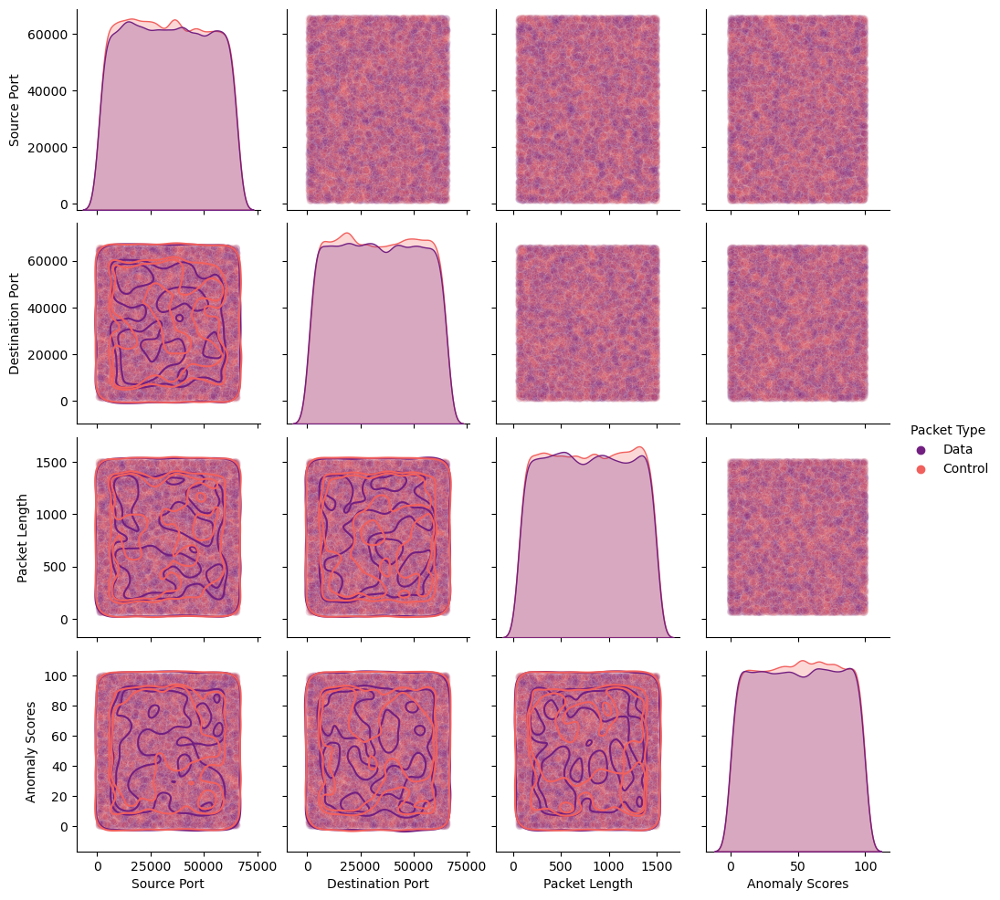

In [38]:
g = sns.pairplot(data = cybersecurity_risks, hue = 'Packet Type', palette = 'magma', diag_kind="kde",  plot_kws={'alpha': 0.1})
g.map_lower(sns.kdeplot, levels = 4)

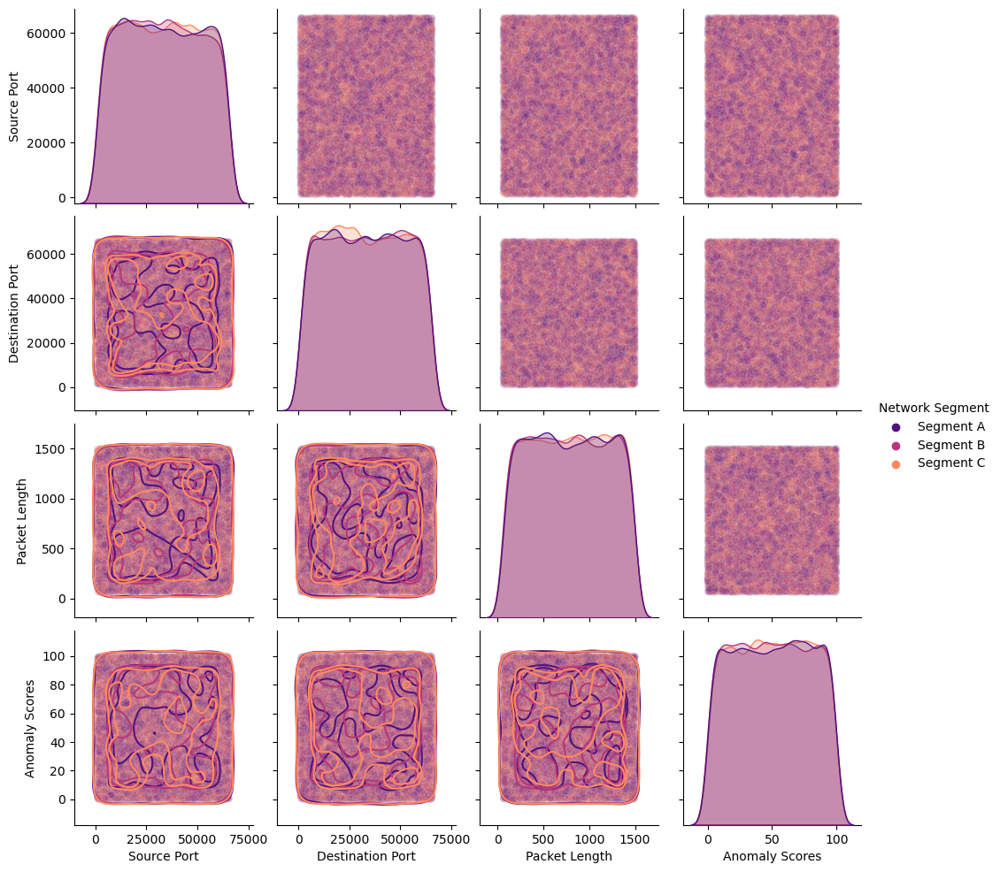

In [39]:
g = sns.pairplot(data = cybersecurity_risks, hue = 'Network Segment', palette = 'magma', diag_kind="kde",  plot_kws={'alpha': 0.1})
g.map_lower(sns.kdeplot, levels = 4)

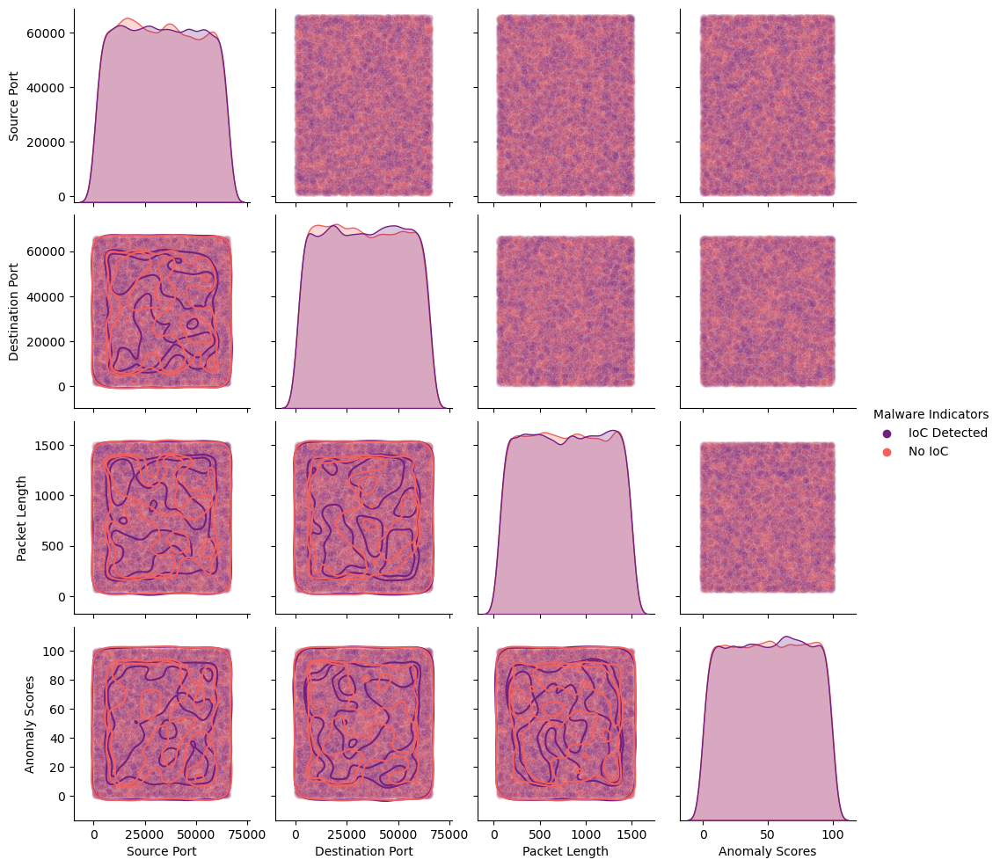

In [40]:
g = sns.pairplot(data = cybersecurity_risks, hue = 'Malware Indicators', palette = 'magma', diag_kind="kde",  plot_kws={'alpha': 0.1})
g.map_lower(sns.kdeplot, levels = 4)

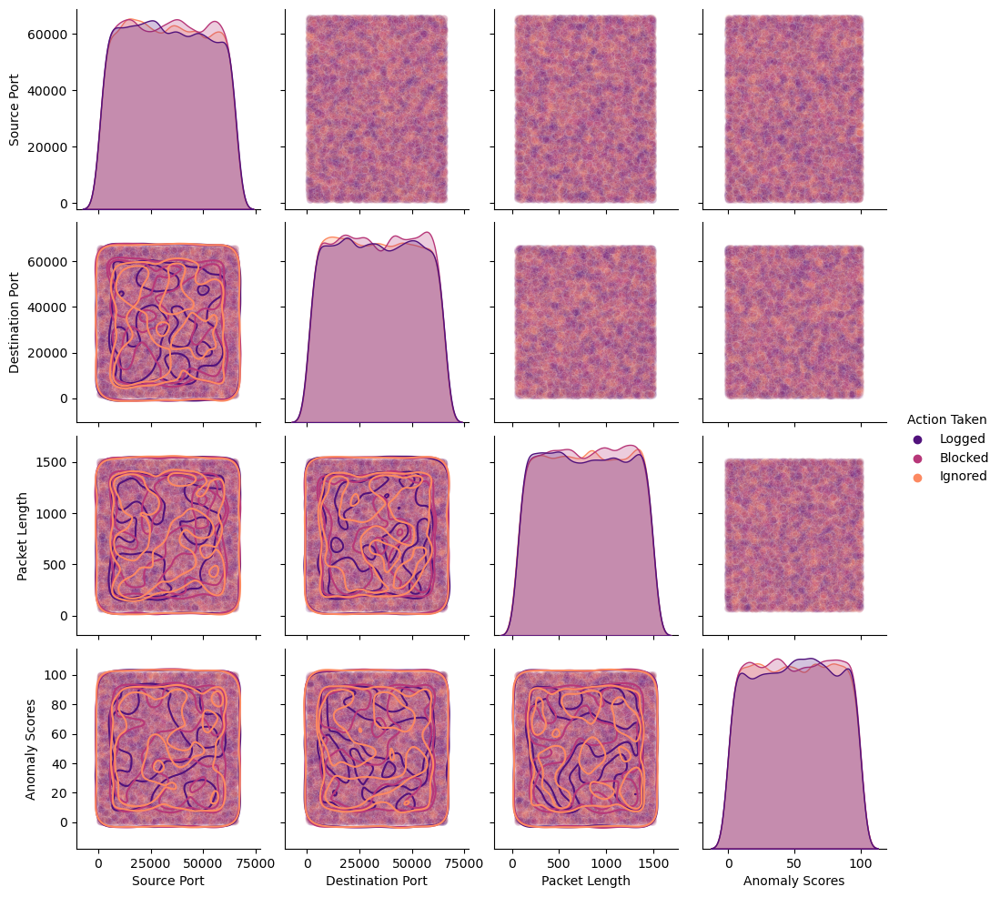

In [41]:
g = sns.pairplot(data = cybersecurity_risks, hue = 'Action Taken', palette = 'magma', diag_kind="kde",  plot_kws={'alpha': 0.1})
g.map_lower(sns.kdeplot, levels = 4)

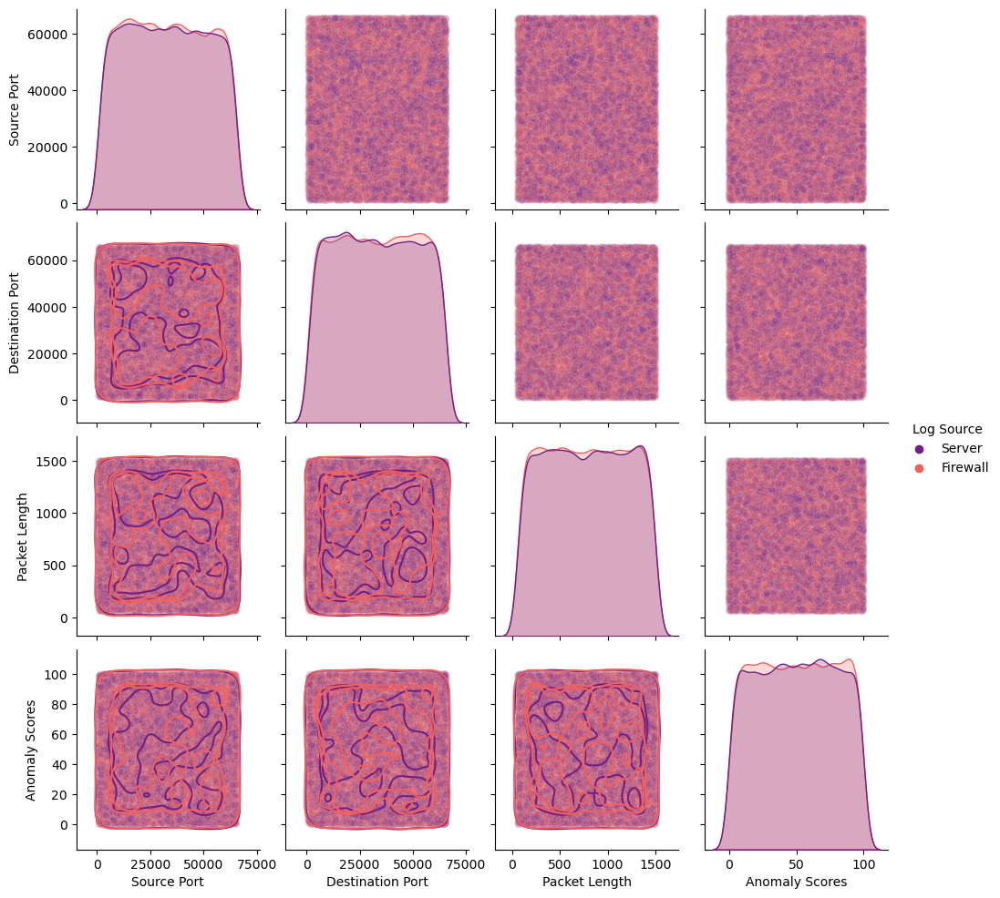

In [42]:
g = sns.pairplot(data = cybersecurity_risks, hue = 'Log Source', palette = 'magma', diag_kind="kde",  plot_kws={'alpha': 0.1})
g.map_lower(sns.kdeplot, levels = 4)

As it is clear from the plots above there is no significant difference overall between the different categories. They are all equally distributed 

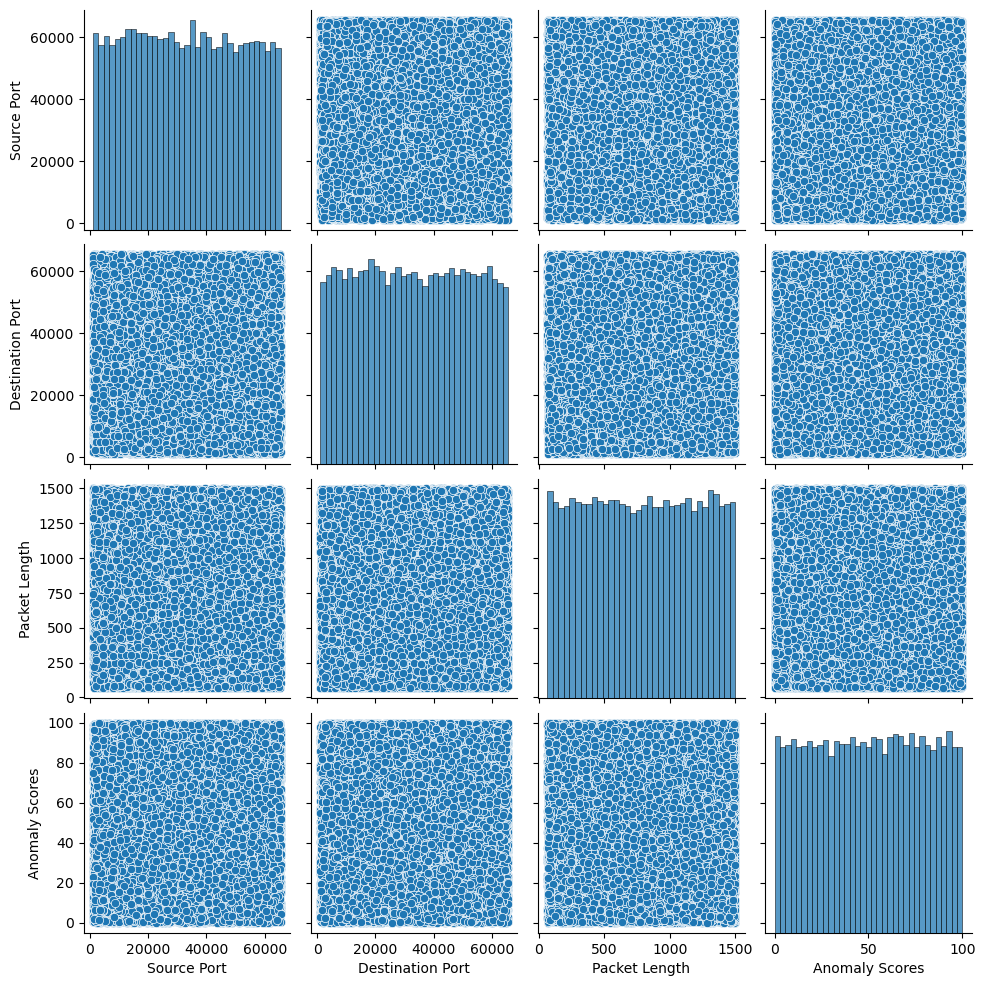

In [43]:
sns.pairplot(data = cybersecurity_risks)

## No significant difference also if we try to plot and compare the differente classes with cross sections

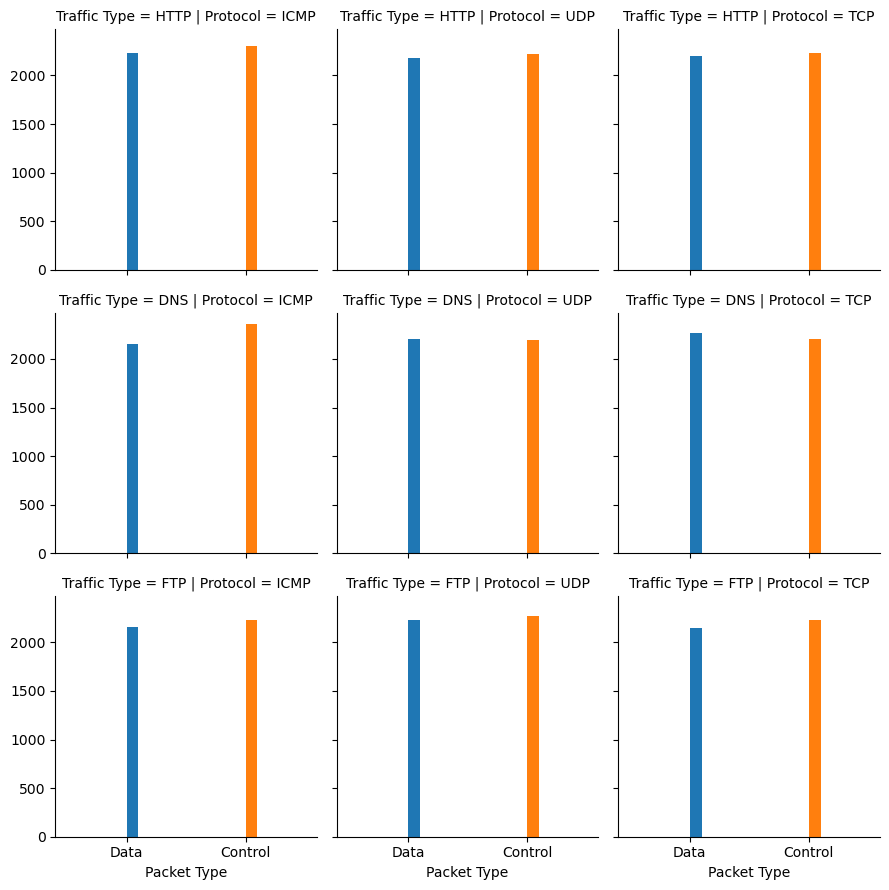

In [79]:
g = sns.FacetGrid(data = cybersecurity_risks, col='Protocol', row = 'Traffic Type', hue = 'Packet Type')
g.map(plt.hist, 'Packet Type')

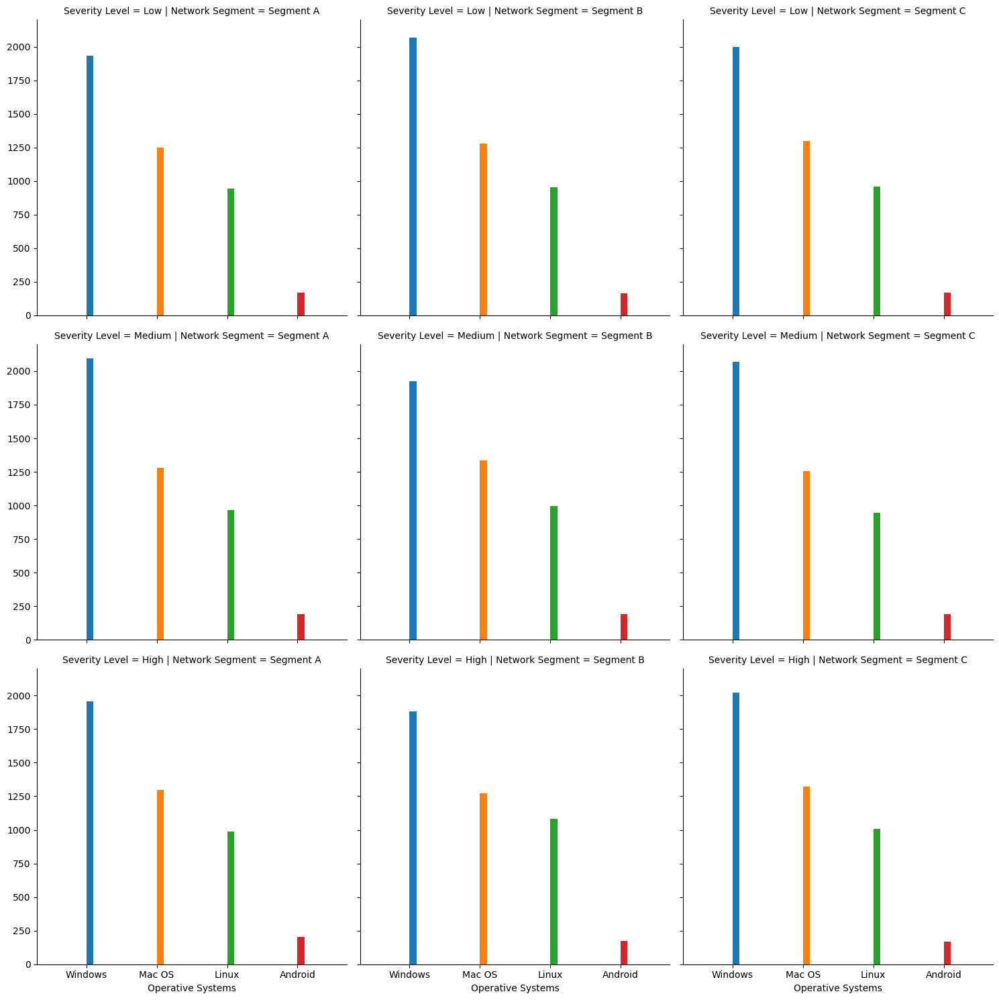

In [83]:
g = sns.FacetGrid(data = cybersecurity_risks, col='Network Segment', row = 'Severity Level', hue = 'Operative Systems', height = 5)
g.map(plt.hist, 'Operative Systems')
plt.tight_layout()

Windows seems to be the ost exposed to risks

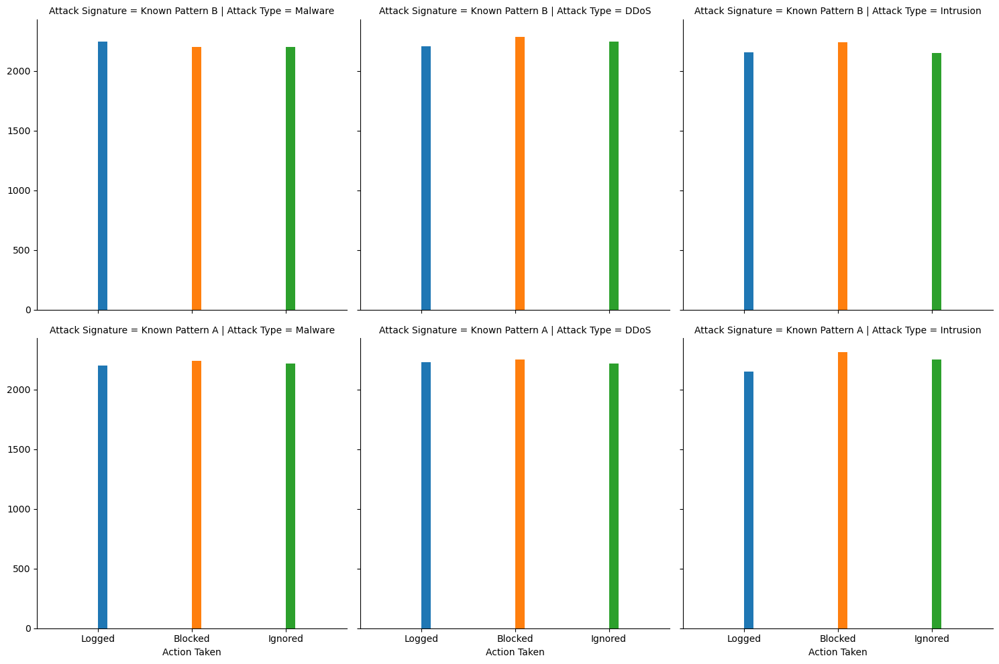

In [84]:
g = sns.FacetGrid(data = cybersecurity_risks, col='Attack Type', row = 'Attack Signature', hue = 'Action Taken', height = 5)
g.map(plt.hist, 'Action Taken')
plt.tight_layout()

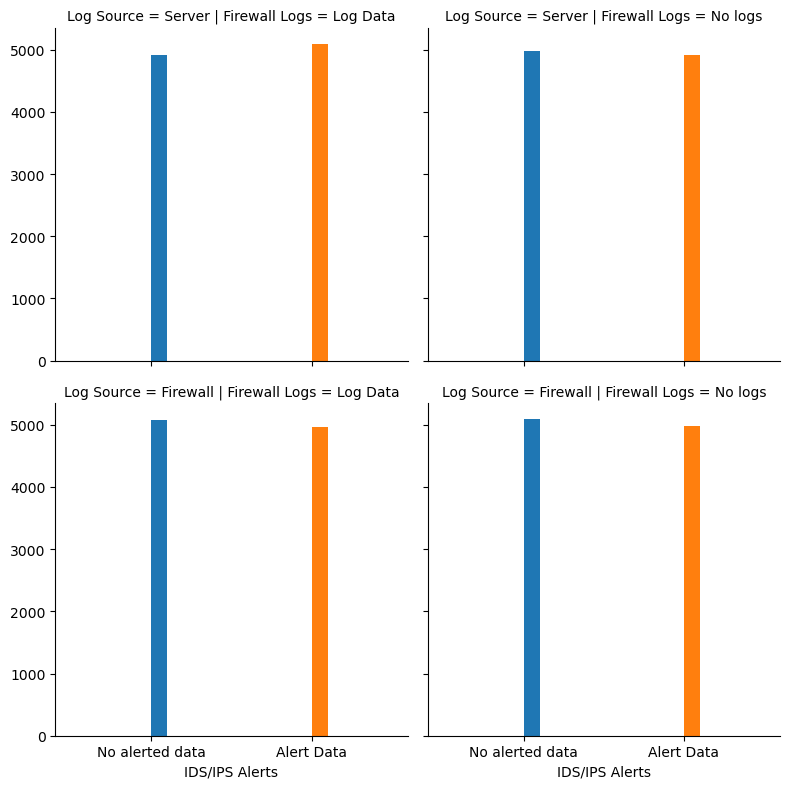

In [87]:
g = sns.FacetGrid(data = cybersecurity_risks, col='Firewall Logs', row = 'Log Source', hue = 'IDS/IPS Alerts', height = 4)
g.map(plt.hist, 'IDS/IPS Alerts')
plt.tight_layout()

## Let's analyze the evolution in time of the risks encountered

In [72]:
count_risks = new_cybersecurity_risks.groupby('monthyear').count()['Timestamp']

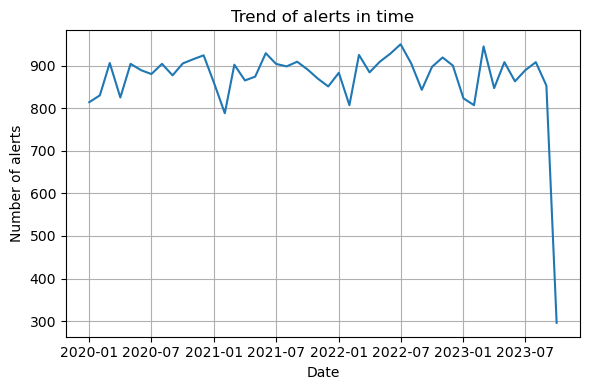

In [73]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
plt.plot(count_risks)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.grid(visible = 'True')
plt.tight_layout()

In [127]:
protocol = cybersecurity_risks['Protocol'].unique()
packet_type = cybersecurity_risks['Packet Type'].unique()
traffic_type = cybersecurity_risks['Traffic Type'].unique()
malware_indicators = cybersecurity_risks['Malware Indicators'].unique()
alerts = cybersecurity_risks['Alerts/Warnings'].unique()
attack_type = cybersecurity_risks['Attack Type'].unique()
attack_signature = cybersecurity_risks['Attack Signature'].unique()
action_taken = cybersecurity_risks['Action Taken'].unique()
severity_level = cybersecurity_risks['Severity Level'].unique()
network_segment = cybersecurity_risks['Network Segment'].unique()
firewall_logs = cybersecurity_risks['Firewall Logs'].unique()
ids_ips_alerts = cybersecurity_risks['IDS/IPS Alerts'].unique()
log_source = cybersecurity_risks['Log Source'].unique()
browser = cybersecurity_risks['Browser'].unique()
operative_systems = cybersecurity_risks['Operative Systems'].unique()
print(attack_signature)

['Known Pattern B' 'Known Pattern A']


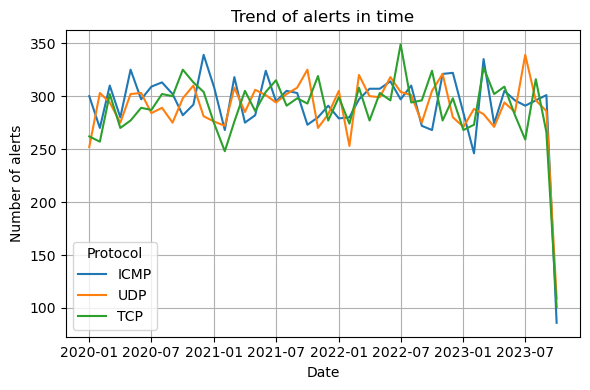

In [103]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in protocol:
    count_risks = cybersecurity_risks[cybersecurity_risks['Protocol'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Protocol')
plt.grid(visible = 'True')
plt.tight_layout()

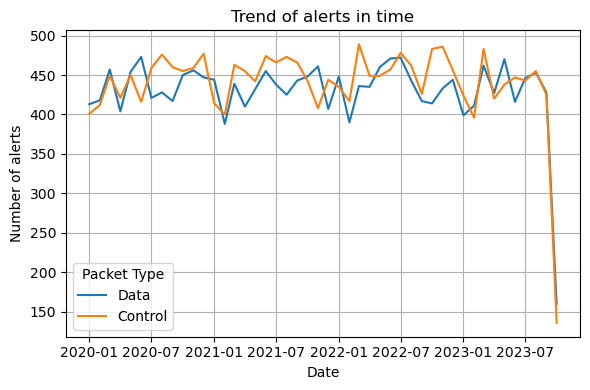

In [104]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in packet_type:
    count_risks = cybersecurity_risks[cybersecurity_risks['Packet Type'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Packet Type')
plt.grid(visible = 'True')
plt.tight_layout()

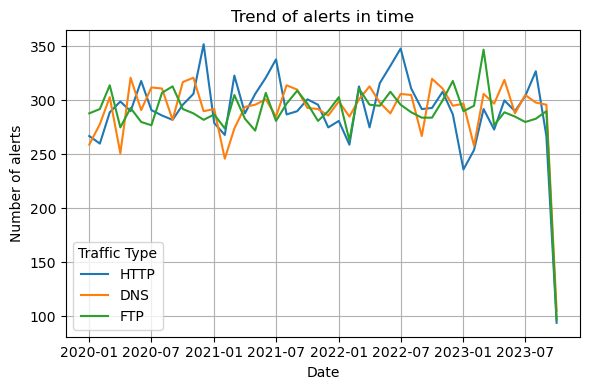

In [105]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in traffic_type:
    count_risks = cybersecurity_risks[cybersecurity_risks['Traffic Type'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Traffic Type')
plt.grid(visible = 'True')
plt.tight_layout()

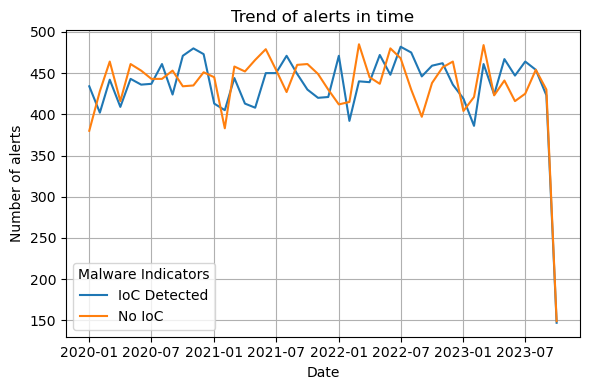

In [106]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in malware_indicators:
    count_risks = cybersecurity_risks[cybersecurity_risks['Malware Indicators'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Malware Indicators')
plt.grid(visible = 'True')
plt.tight_layout()

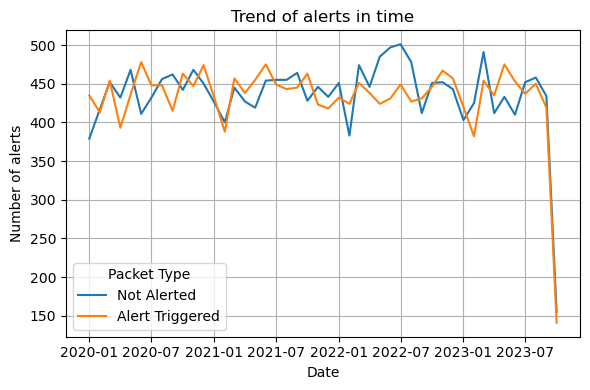

In [107]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in alerts:
    count_risks = cybersecurity_risks[cybersecurity_risks['Alerts/Warnings'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Packet Type')
plt.grid(visible = 'True')
plt.tight_layout()

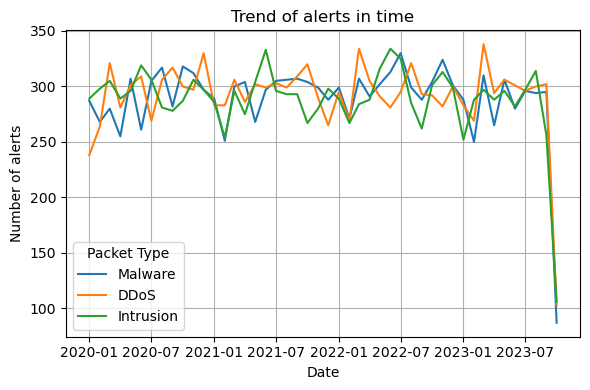

In [108]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in attack_type:
    count_risks = cybersecurity_risks[cybersecurity_risks['Attack Type'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Packet Type')
plt.grid(visible = 'True')
plt.tight_layout()

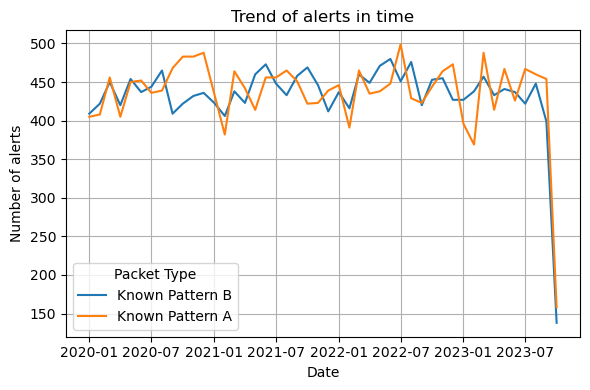

In [109]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in attack_signature:
    count_risks = cybersecurity_risks[cybersecurity_risks['Attack Signature'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Packet Type')
plt.grid(visible = 'True')
plt.tight_layout()

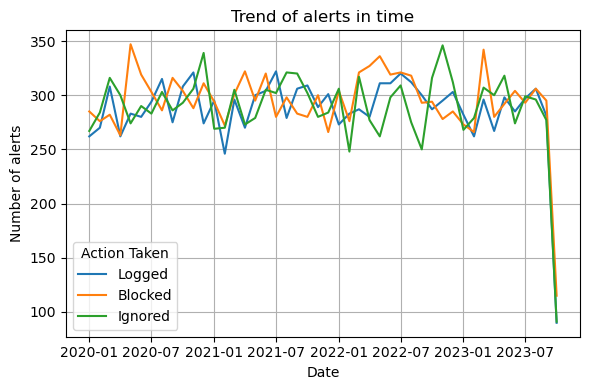

In [128]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in action_taken:
    count_risks = cybersecurity_risks[cybersecurity_risks['Action Taken'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Action Taken')
plt.grid(visible = 'True')
plt.tight_layout()

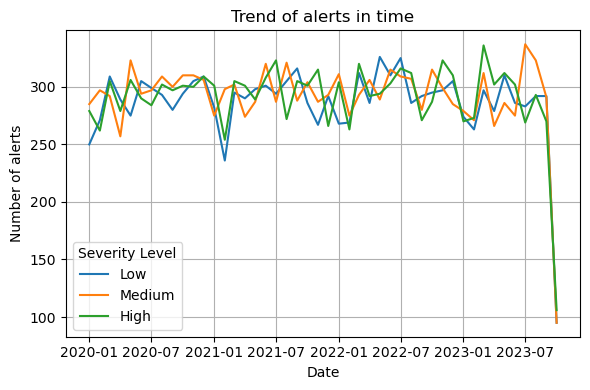

In [129]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in severity_level:
    count_risks = cybersecurity_risks[cybersecurity_risks['Severity Level'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Severity Level')
plt.grid(visible = 'True')
plt.tight_layout()

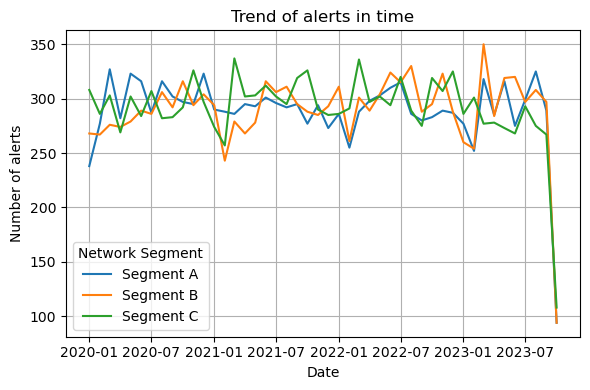

In [130]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in network_segment:
    count_risks = cybersecurity_risks[cybersecurity_risks['Network Segment'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Network Segment')
plt.grid(visible = 'True')
plt.tight_layout()

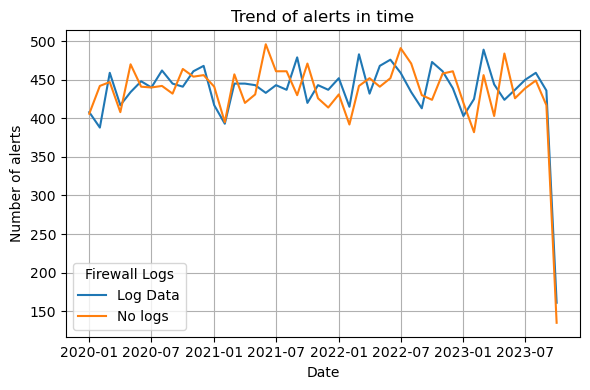

In [131]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in firewall_logs:
    count_risks = cybersecurity_risks[cybersecurity_risks['Firewall Logs'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Firewall Logs')
plt.grid(visible = 'True')
plt.tight_layout()

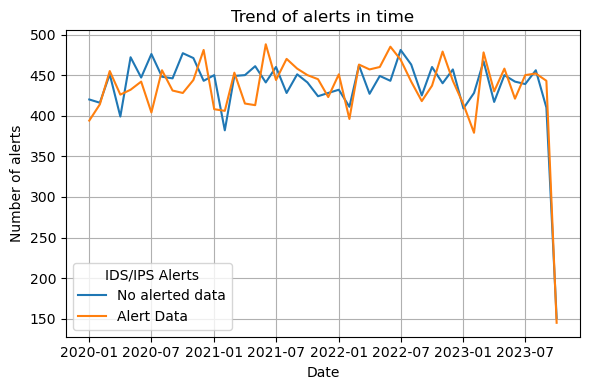

In [132]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in ids_ips_alerts:
    count_risks = cybersecurity_risks[cybersecurity_risks['IDS/IPS Alerts'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'IDS/IPS Alerts')
plt.grid(visible = 'True')
plt.tight_layout()

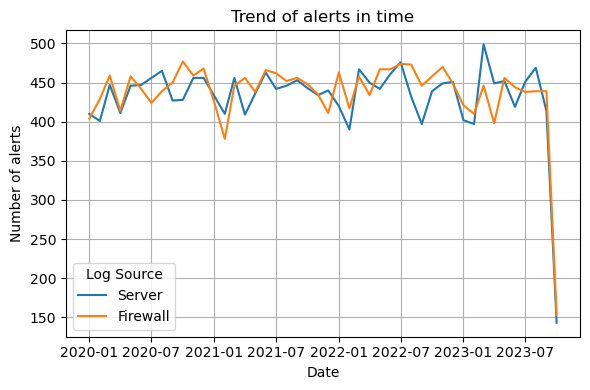

In [133]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in log_source:
    count_risks = cybersecurity_risks[cybersecurity_risks['Log Source'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Log Source')
plt.grid(visible = 'True')
plt.tight_layout()

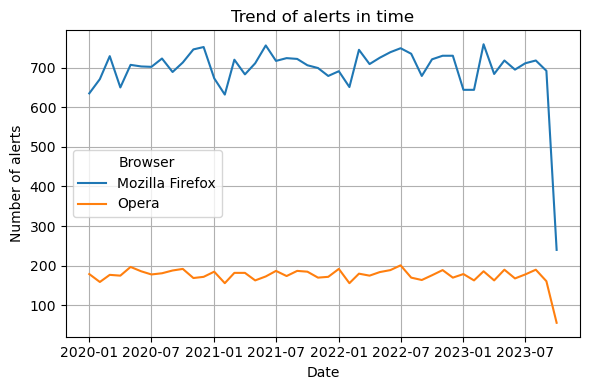

In [134]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in browser:
    count_risks = cybersecurity_risks[cybersecurity_risks['Browser'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Browser')
plt.grid(visible = 'True')
plt.tight_layout()

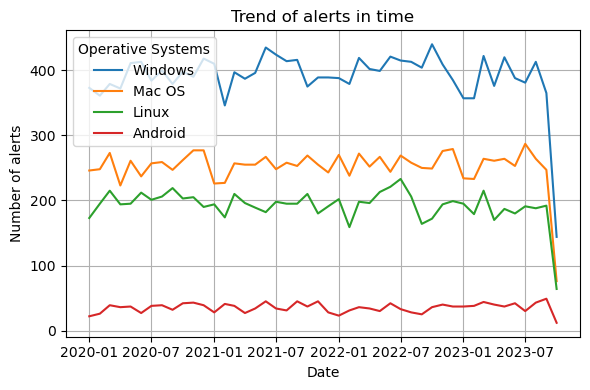

In [135]:
axes,fig = plt.subplots(1,1, figsize = (6,4))
for i in operative_systems:
    count_risks = cybersecurity_risks[cybersecurity_risks['Operative Systems'] == i].groupby('monthyear').count()['Timestamp']
    plt.plot(count_risks, label = i)
plt.xlabel('Date')
plt.ylabel('Number of alerts')
plt.title('Trend of alerts in time')
plt.legend(title = 'Operative Systems')
plt.grid(visible = 'True')
plt.tight_layout()

Significant security breach in July 2022 during which a malware was passed to computers via http traffic. This breach was not alerted in time. 
A second security breach happened in February 2023, it was a high level breach that was not alerted in time, it was finally blocked and the virus was a DDoS.